# Decision Tree using Python

First, we will change the location in which the python notebook is open.

In [1]:
import os

In [2]:
%pwd

'c:\\Users\\rahul\\Desktop\\Project\\Machine-Learning-using-Python\\03. Decision Tree and Random Forest'

In [3]:
os.chdir("../")

In [4]:
%pwd

'c:\\Users\\rahul\\Desktop\\Project\\Machine-Learning-using-Python'

## Problem Statement

> The Rain in Australia dataset contains about 10 years of daily weather observations from numerous Australian weather stations. As a data scientist at the Bureau of Meteorology, you are tasked with creating a fully-automated system that can use today's weather data for a given location to predict whether it will rain at the location tomorrow.

In [5]:
import opendatasets as od
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
import plotly.express as px
%matplotlib inline

In [6]:
matplotlib.rcParams["font.size"] = 14
matplotlib.rcParams["figure.figsize"] = (10, 6)
matplotlib.rcParams["figure.facecolor"] = "#00000000"

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 10)
sns.set_style("darkgrid")

#### Downloading the dataset

In [ ]:
od.download("https://www.kaggle.com/jsphyg/weather-dataset-rattle-package", data_dir = "Dataset/")

Skipping, found downloaded files in "Dataset/weather-dataset-rattle-package" (use force=True to force download)


In [8]:
os.listdir("Dataset/weather-dataset-rattle-package")

['weatherAUS.csv']

In [9]:
raw_df = pd.read_csv("Dataset/weather-dataset-rattle-package/weatherAUS.csv")

In [10]:
raw_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [11]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [12]:
raw_df.dropna(subset = ["RainToday", "RainTomorrow"], inplace = True)

In [13]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null   fl

In [14]:
new = raw_df.groupby(["Location"]).agg({
    "MinTemp": "min",
    "MaxTemp": "max",
    "Rainfall": "mean"
}).reset_index()

In [15]:
new.columns = ["Location", "MinTemp (min)", "MaxTemp (max)", "Rainfall (avg)"]

In [16]:
new.head()

,Location,MinTemp (min),MaxTemp (max),Rainfall (avg)
0,Adelaide,0.7,45.7,1.572185
1,Albany,1.8,39.0,2.255073
2,Albury,-2.8,44.8,1.925710
3,AliceSprings,-5.2,44.9,0.869355
4,BadgerysCreek,-1.9,46.4,2.207925


In [17]:
px.histogram(
    raw_df,
    x = "RainTomorrow",
    color = "RainToday",
    title = "Distrubution of Rain Tomorrow"
)

In [18]:
px.scatter(
    raw_df,
    x = "MinTemp",
    y = "MaxTemp",
    color = "RainTomorrow",
    title = "Temperature Range vs Rain Tomorrow"
)

In [19]:
raw_copy = raw_df.copy()
rain_map = {
    "No": 0,
    "Yes": 1
}

raw_copy["RainToday"] = raw_copy["RainToday"].map(rain_map)
raw_copy["RainTomorrow"] = raw_copy["RainTomorrow"].map(rain_map)

In [20]:
numerical_cols = raw_copy.select_dtypes(include = "number").columns

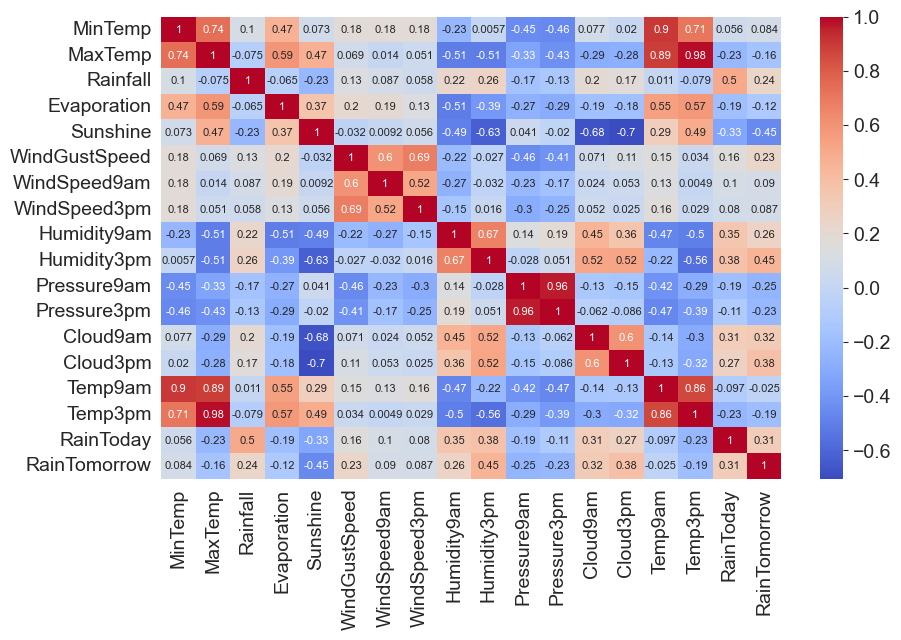

In [21]:
corr = raw_copy[numerical_cols].corr()

sns.heatmap(corr, annot = True, annot_kws = {"size": 8}, cmap = "coolwarm")
plt.show()

#### Preparing the Data for the training

##### Training, Validation and Test dataset

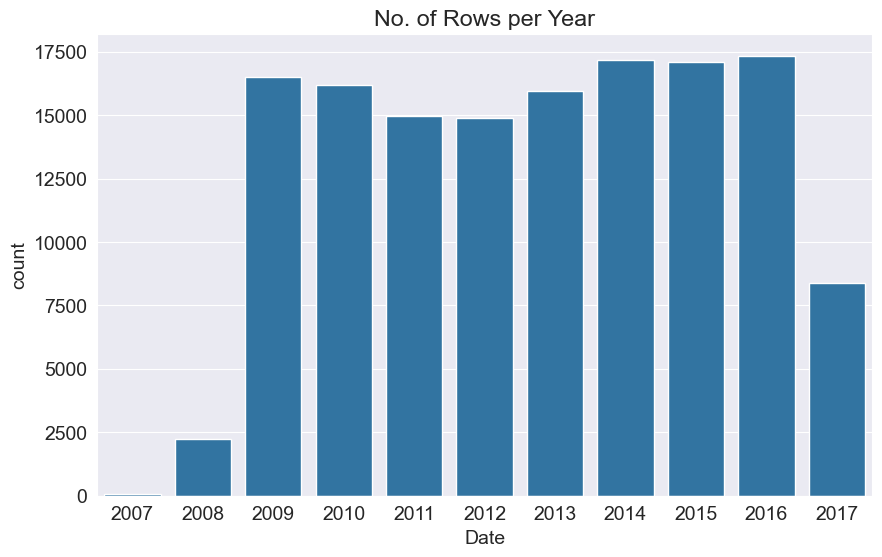

In [22]:
plt.title("No. of Rows per Year")
sns.countplot(
    x = pd.to_datetime(raw_df.Date).dt.year
)
plt.show()

In [23]:
year = pd.to_datetime(raw_df.Date).dt.year

train_data = raw_df[year < 2015]
val_data = raw_df[year == 2015]
test_data = raw_df[year > 2015]

In [24]:
print(f"Training Data shape: {train_data.shape}")
print(f"Validation Data shape: {val_data.shape}")
print(f"Test Data shape: {test_data.shape}")

Training Data shape: (97988, 23)
Validation Data shape: (17089, 23)
Test Data shape: (25710, 23)


##### Input and Target Columns

In [25]:
input_cols = list(raw_df.columns)[1:-1]
target_col = "RainTomorrow"

In [26]:
train_inputs = train_data[input_cols].copy()
train_targets = train_data[target_col].copy()

In [27]:
val_inputs = val_data[input_cols].copy()
val_targets = val_data[target_col].copy()

In [28]:
test_inputs = test_data[input_cols].copy()
test_targets = test_data[target_col].copy()

In [29]:
numerical_cols = raw_df.select_dtypes(include = np.number).columns.tolist()

categorical_cols = list(set(input_cols) - set(numerical_cols))

#### Imputing numeric columns

In [30]:
from sklearn.impute import SimpleImputer

In [31]:
imputer = SimpleImputer(strategy = "mean").fit(raw_df[numerical_cols])

In [32]:
train_inputs[numerical_cols] = imputer.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = imputer.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = imputer.transform(test_inputs[numerical_cols])

In [33]:
test_inputs[numerical_cols].isna().sum()

MinTemp        0
MaxTemp        0
Rainfall       0
Evaporation    0
Sunshine       0
              ..
Pressure3pm    0
Cloud9am       0
Cloud3pm       0
Temp9am        0
Temp3pm        0
Length: 16, dtype: int64

#### Scaling Numeric features

In [34]:
val_inputs.describe().loc[["min", "max"]]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
min,-8.2,-3.2,0.0,0.0,0.0,7.0,0.0,0.0,4.0,0.0,988.1,982.2,0.0,0.0,-6.2,-4.0
max,31.9,45.4,247.2,70.4,14.5,135.0,87.0,74.0,100.0,100.0,1039.3,1037.3,8.0,8.0,37.5,42.8


In [35]:
from sklearn.preprocessing import MinMaxScaler

In [36]:
scaler = MinMaxScaler().fit(raw_df[numerical_cols])

In [37]:
train_inputs[numerical_cols] = scaler.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = scaler.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = scaler.transform(test_inputs[numerical_cols])

In [38]:
val_inputs.describe().loc[["min", "max"]]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
min,0.007075,0.030246,0.000000,0.000000,0.0,0.007752,0.000000,0.000000,0.04,0.0,0.125620,0.0816,0.000000,0.000000,0.021097,0.026871
max,0.952830,0.948960,0.666307,0.485517,1.0,1.000000,0.669231,0.850575,1.00,1.0,0.971901,0.9632,0.888889,0.888889,0.943038,0.925144


#### Encoding Categorical features

In [39]:
from sklearn.preprocessing import OneHotEncoder

In [40]:
train_inputs[categorical_cols] = train_inputs[categorical_cols].fillna("Unknown")
val_inputs[categorical_cols] = val_inputs[categorical_cols].fillna("Unknown")
test_inputs[categorical_cols] = test_inputs[categorical_cols].fillna("Unknown")

In [41]:
encoder = OneHotEncoder(sparse_output = False,
                        handle_unknown = "ignore").fit(train_inputs[categorical_cols])

In [42]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

In [43]:
# Encode the categorical columns
encoded_train_cols = pd.DataFrame(encoder.transform(train_inputs[categorical_cols]), columns = encoded_cols, index = train_inputs.index)
encoded_val_cols = pd.DataFrame(encoder.transform(val_inputs[categorical_cols]), columns = encoded_cols, index = val_inputs.index)
encoded_test_cols = pd.DataFrame(encoder.transform(test_inputs[categorical_cols]), columns = encoded_cols, index = test_inputs.index)

# Concatenate the new encoded columns with the existing dataframes
train_inputs = pd.concat([train_inputs, encoded_train_cols], axis = 1)
val_inputs = pd.concat([val_inputs, encoded_val_cols], axis = 1)
test_inputs = pd.concat([test_inputs, encoded_test_cols], axis = 1)

In [44]:
X_train = train_inputs[numerical_cols + encoded_cols]
X_val = val_inputs[numerical_cols + encoded_cols]
X_test = test_inputs[numerical_cols + encoded_cols]

In [45]:
X_test.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_Unknown,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_Unknown,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_Unknown,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,RainToday_No,RainToday_Yes
2498,0.681604,0.801512,0.000000,0.037741,0.526244,0.372093,0.000000,0.080460,0.46,0.17,0.543802,0.5136,0.777778,0.333333,0.702532,0.808061,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2499,0.693396,0.725898,0.001078,0.037741,0.526244,0.341085,0.069231,0.195402,0.54,0.30,0.505785,0.5008,0.888889,0.888889,0.675105,0.712092,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2500,0.634434,0.527410,0.005930,0.037741,0.526244,0.325581,0.084615,0.448276,0.62,0.67,0.553719,0.6032,0.888889,0.888889,0.611814,0.477927,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2501,0.608491,0.538752,0.042049,0.037741,0.526244,0.255814,0.069231,0.195402,0.74,0.65,0.618182,0.6304,0.888889,0.888889,0.556962,0.518234,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

#### Training and Visualising the Decision Trees

In [46]:
from sklearn.tree import DecisionTreeClassifier

In [47]:
model = DecisionTreeClassifier(random_state = 42)

In [48]:
%%time

model.fit(X_train, train_targets)

CPU times: total: 1.69 s
Wall time: 2.05 s


DecisionTreeClassifier(random_state=42)

#### Evaluation

In [49]:
train_preds = model.predict(X_train)

In [50]:
pd.value_counts(train_preds)

C:\Users\rahul\AppData\Local\Temp\ipykernel_14140\1258350197.py:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



No     76192
Yes    21796
Name: count, dtype: int64

In [51]:
pd.value_counts(train_targets)

C:\Users\rahul\AppData\Local\Temp\ipykernel_14140\2026127828.py:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



RainTomorrow
No     76190
Yes    21798
Name: count, dtype: int64

In [52]:
from sklearn.metrics import accuracy_score, confusion_matrix

In [53]:
accuracy_score(train_preds, train_targets)

0.9999795893374699

The decision tree also returns probabilities for each prediction

In [54]:
train_probs = model.predict_proba(X_train)

In [55]:
train_probs[:5]

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.]])

In [56]:
model.score(X_val, val_targets)

0.7944291649599158

We getting the accuracy of 99.99% on the training set and 79.37% on the validationn set, which means that our model is overfitted.

In [57]:
val_targets.value_counts() / len(val_targets)

RainTomorrow
No     0.790626
Yes    0.209374
Name: count, dtype: float64

We see that the majority class in the validation set is 0 (No rain), which means our model is predicting all the instances as No rain.

#### Visualization

In [58]:
from sklearn.tree import plot_tree, export_text

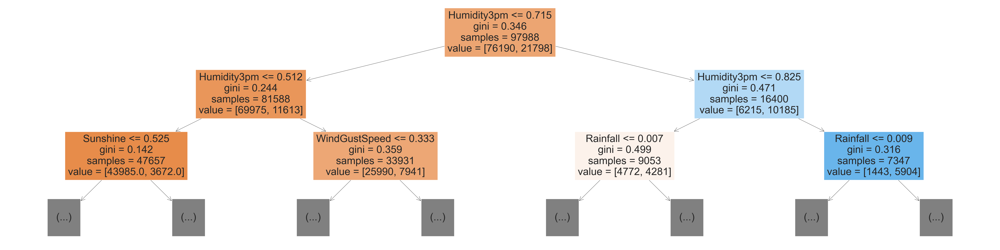

In [59]:
plt.figure(figsize = (80, 20))
plot_tree(model, feature_names = X_train.columns, max_depth = 2, filled = True)
plt.show()

In [60]:
model.tree_.max_depth

49

In [61]:
tree_text = export_text(model, feature_names = X_train.columns, max_depth = 10)

In [62]:
print(tree_text[:1000])

|--- Humidity3pm <= 0.72
|   |--- Humidity3pm <= 0.51
|   |   |--- Sunshine <= 0.53
|   |   |   |--- Pressure3pm <= 0.58
|   |   |   |   |--- Pressure3pm <= 0.44
|   |   |   |   |   |--- Humidity3pm <= 0.24
|   |   |   |   |   |   |--- WindGustDir_N <= 0.50
|   |   |   |   |   |   |   |--- WindSpeed9am <= 0.32
|   |   |   |   |   |   |   |   |--- Pressure3pm <= 0.44
|   |   |   |   |   |   |   |   |   |--- WindSpeed3pm <= 0.06
|   |   |   |   |   |   |   |   |   |   |--- class: Yes
|   |   |   |   |   |   |   |   |   |--- WindSpeed3pm >  0.06
|   |   |   |   |   |   |   |   |   |   |--- Temp9am <= 0.65
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |   |--- Temp9am >  0.65
|   |   |   |   |   |   |   |   |   |   |   |--- class: No
|   |   |   |   |   |   |   |   |--- Pressure3pm >  0.44
|   |   |   |   |   |   |   |   |   |--- class: Yes
|   |   |   |   |   |   |   |--- WindSpeed9am >  0.32
|   |   |   |   |   |   |   | 

#### Feature Importance

In [63]:
importance_df = pd.DataFrame({
    "feature": X_train.columns,
    "importance": model.feature_importances_
}).sort_values(by = "importance", ascending = False)

In [64]:
importance_df.head(10)

,feature,importance
9,Humidity3pm,0.279922
11,Pressure3pm,0.061770
5,WindGustSpeed,0.060041
4,Sunshine,0.047067
2,Rainfall,0.044811
10,Pressure9am,0.037915
8,Humidity9am,0.037807
14,Temp9am,0.036575
0,MinTemp,0.036547
15,Temp3pm,0.032868


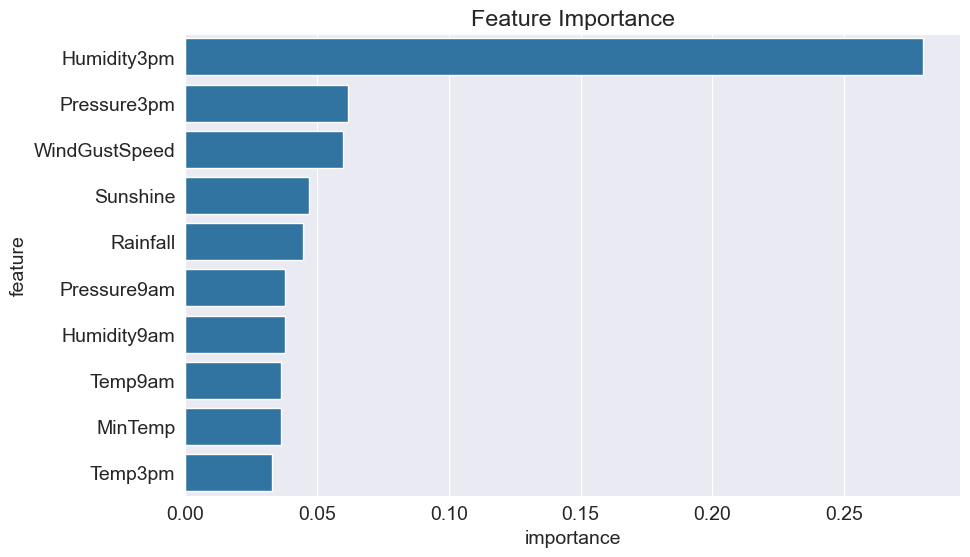

In [65]:
plt.title("Feature Importance")
sns.barplot(
    x = "importance",
    y = "feature",
    data = importance_df.head(10)
)
plt.show()

#### Hyper Parameter Tuning and Overfitting

The process of reducing the overfitting is called Regularization.

### max_depth

In [66]:
model = DecisionTreeClassifier(max_depth = 5, random_state = 42)

In [67]:
model.fit(X_train, train_targets)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [68]:
model.score(X_train, train_targets)

0.8427562558680655

In [69]:
model.score(X_val, val_targets)

0.8418865937152554

In [70]:
model.classes_

array(['No', 'Yes'], dtype=object)

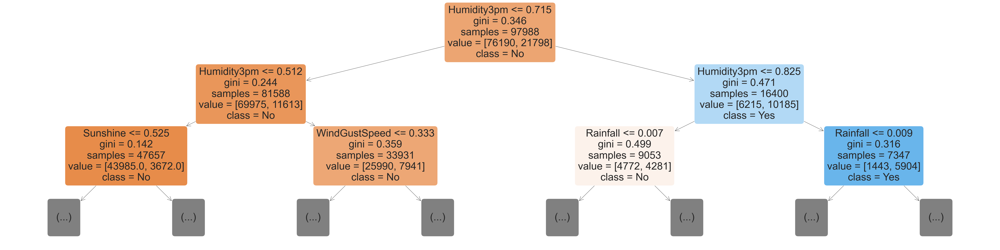

In [71]:
plt.figure(figsize = (80, 20))
plot_tree(model, 
          max_depth = 2, 
          feature_names = X_train.columns, 
          filled = True, 
          rounded = True, 
          class_names = model.classes_)
plt.show()

In [72]:
def max_depth_error(md):
    model = DecisionTreeClassifier(max_depth = md, random_state = 42)
    model.fit(X_train, train_targets)
    train_error = 1 - model.score(X_train, train_targets)
    val_error = 1 - model.score(X_val, val_targets)
    return {"Max_Depth": md,
            "Training_Error": train_error,
            "Val_Error": val_error}

In [73]:
%%time

errors_df = pd.DataFrame([max_depth_error(md) for md in range(1, 21)])

CPU times: total: 22.1 s
Wall time: 23.6 s


In [74]:
errors_df

,Max_Depth,Training_Error,Val_Error
0,1,0.181941,0.176488
1,2,0.176930,0.170695
2,3,0.168408,0.165194
3,4,0.162153,0.161624
4,5,0.157244,0.158113
...,...,...,...
15,16,0.068008,0.176371
16,17,0.057987,0.178419
17,18,0.049200,0.181228
18,19,0.040525,0.182164


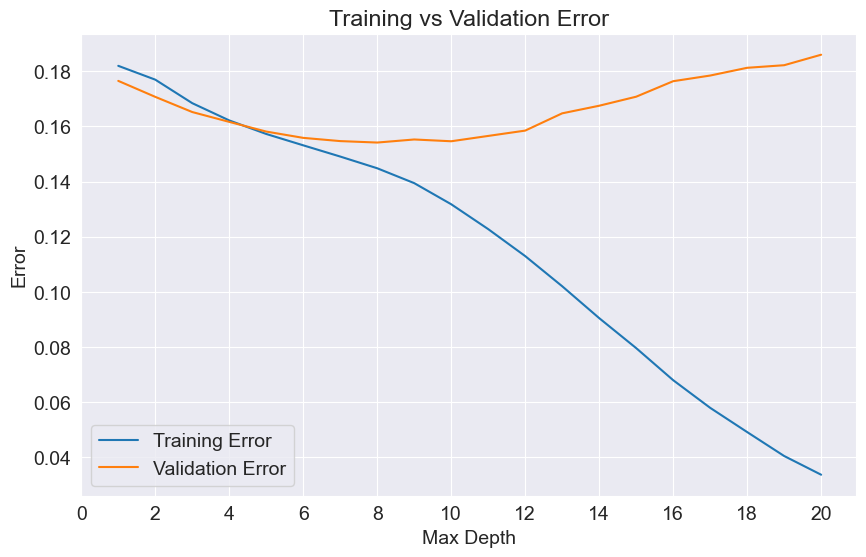

In [75]:
plt.figure()
plt.plot(errors_df["Max_Depth"], errors_df["Training_Error"])
plt.plot(errors_df["Max_Depth"], errors_df["Val_Error"])
plt.xticks(range(0, 21, 2))
plt.title("Training vs Validation Error")
plt.xlabel("Max Depth")
plt.ylabel("Error")
plt.legend(["Training Error", "Validation Error"])
plt.grid(True)
plt.show()

In [76]:
model = DecisionTreeClassifier(max_depth = 7, random_state = 42)

In [77]:
model.fit(X_train, train_targets)

DecisionTreeClassifier(max_depth=7, random_state=42)

In [78]:
model.score(X_train, train_targets), model.score(X_val, val_targets)

(0.8509409315426378, 0.8453391070279127)

### max_leaf_nodes

In [79]:
model = DecisionTreeClassifier(max_leaf_nodes = 128, random_state = 42).fit(X_train, train_targets)

In [80]:
model.score(X_train, train_targets), model.score(X_val, val_targets)

(0.852696248520227, 0.8471531394464276)

In [81]:
model.tree_.max_depth

11

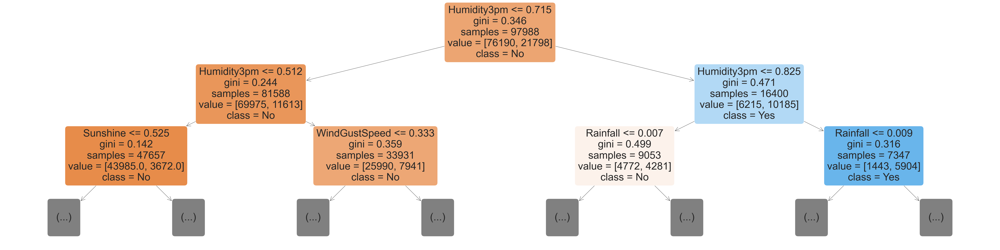

In [82]:
plt.figure(figsize = (80, 20))
plot_tree(
    model, 
    max_depth = 2, 
    feature_names = X_train.columns, 
    filled = True, 
    rounded = True, 
    class_names = model.classes_
)

plt.show()

In [83]:
max_depth = [i for i in range(1, 21)]
leaf_nodes = [64, 128, 256, 512]

In [84]:
def errors_df_combo(max_depth, leaf_nodes):
    results = []  # Create an empty list to store the results
    for depth in max_depth:
        for nodes in leaf_nodes:
            model = DecisionTreeClassifier(max_depth = depth, max_leaf_nodes = nodes, random_state = 42)
            model.fit(X_train, train_targets)
            train_error = 1 - model.score(X_train, train_targets)
            val_error = 1 - model.score(X_val, val_targets)
            # Append each result as a dictionary to the list
            results.append({"Max_Depth": depth,
                            "Max_Leaf_Nodes": nodes,
                            "Training_Error": train_error,
                            "Val_Error": val_error})
    return results

In [85]:
errors_list = errors_df_combo(max_depth, leaf_nodes)
errors_df = pd.DataFrame(errors_list)

In [86]:
errors_df.sort_values("Val_Error", ascending = True).head()

,Max_Depth,Max_Leaf_Nodes,Training_Error,Val_Error
42,11,256,0.140762,0.151618
46,12,256,0.140231,0.151794
38,10,256,0.141354,0.152028
50,13,256,0.140048,0.152554
78,20,256,0.140150,0.152613


The highest accuracy for the Validation set we getting on is the (max_depth = 11, leaf_node = 256)

## RandomForestClassifier

In [88]:
from sklearn.ensemble import RandomForestClassifier

In [89]:
model = RandomForestClassifier(n_jobs = -1, random_state = 42)

In [90]:
model.fit(X_train, train_targets)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [91]:
model.score(X_train, train_targets), model.score(X_test, test_targets)

(0.9999693840062048, 0.8472578763127188)

In [92]:
train_probs = model.predict_proba(X_train)
train_probs

array([[0.93, 0.07],
       [0.97, 0.03],
       [0.99, 0.01],
       ...,
       [0.98, 0.02],
       [0.99, 0.01],
       [0.97, 0.03]])

In [95]:
model.estimators_[0]

DecisionTreeClassifier(max_features='sqrt', random_state=1608637542)

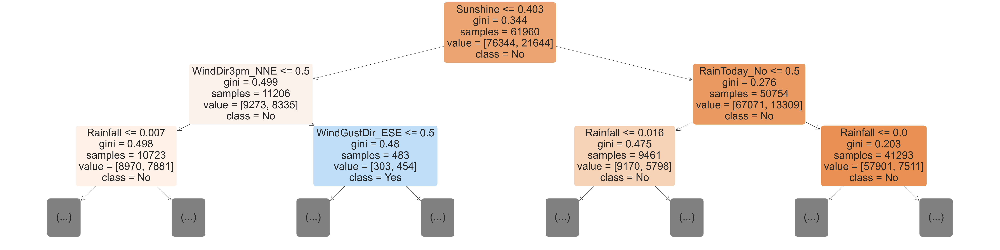

In [98]:
plt.figure(figsize = (80, 20))
plot_tree(model.estimators_[0],
          max_depth = 2,
          feature_names = X_train.columns,
          filled = True,
          rounded = True,
          class_names = model.classes_)

plt.show()

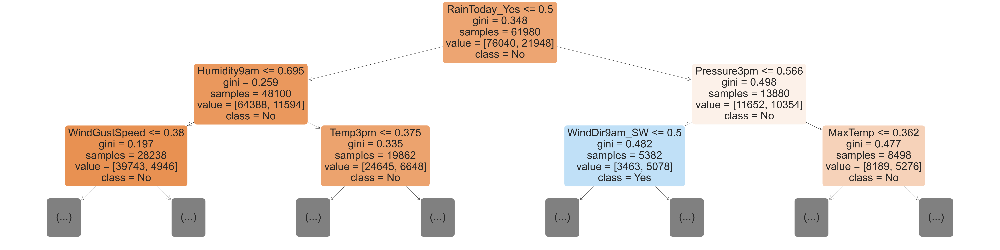

In [99]:
plt.figure(figsize = (80, 20))
plot_tree(model.estimators_[20],
          max_depth = 2,
          feature_names = X_train.columns,
          filled = True,
          rounded = True,
          class_names = model.classes_)

plt.show()

In [100]:
len(model.estimators_)

100

In [107]:
importance_df = pd.DataFrame({
    "feature": X_train.columns,
    "importance": model.feature_importances_
}).sort_values("importance", ascending = False)

In [108]:
importance_df.head(10)

,feature,importance
9,Humidity3pm,0.134320
4,Sunshine,0.056989
11,Pressure3pm,0.051991
10,Pressure9am,0.050567
8,Humidity9am,0.049219
2,Rainfall,0.048851
5,WindGustSpeed,0.047226
15,Temp3pm,0.046078
1,MaxTemp,0.042974
0,MinTemp,0.041849


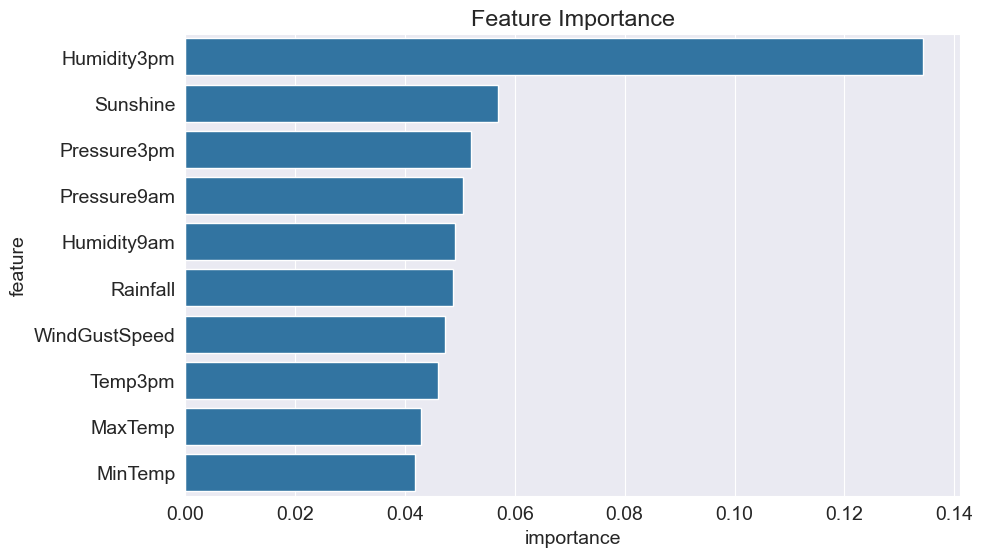

In [109]:
plt.title("Feature Importance")
sns.barplot(data = importance_df.head(10), x = "importance", y = "feature")
plt.show()